# Object masks from prompts with SAM in TF

The Segment Anything Model (SAM) predicts object masks given prompts 
that indicate the desired object. The model first converts the image 
into an image embedding that allows high quality masks to be efficiently 
produced from a prompt.

The `SAMPredictor` class provides an easy interface to the model for 
prompting the model. It allows the user to first set an image using 
the `set_image` method, which calculates the necessary image embeddings. 
Then, prompts can be provided via `__call__` to efficiently predict 
masks from those prompts. The model can take as input both point and 
box prompts, as well as masks from the previous iteration of prediction.

## Environment Set-up

If running locally using jupyter, first install `tfimm` in your environment and additionally install `jupyter`, `opencv-python` and `matplotlib`. If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'.

In [1]:
using_colab = False

In [2]:
if using_colab:
    import tensorflow as tf
    import torchvision
    print("TensorFlow version:", tf.__version__)
    print("GPUs available:", tf.config.list_physical_devices("GPU"))
    import sys
    !{sys.executable} -m pip install tfimm opencv-python matplotlib
    
    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/groceries.jpg

## Set-up

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

import tfimm
from tfimm.architectures.segment_anything import SAMPredictor

In [4]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate(
            [np.random.random(3), np.array([0.6])], axis=0
        )
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(
        pos_points[:, 0], 
        pos_points[:, 1], 
        color="green", 
        marker="*", 
        s=marker_size, 
        edgecolor="white", 
        linewidth=1.25,
    )
    ax.scatter(
        neg_points[:, 0], 
        neg_points[:, 1], 
        color="red", 
        marker="*", 
        s=marker_size, 
        edgecolor="white", 
        linewidth=1.25,
    )   
    
def show_boxes(boxes, ax):
    for box in boxes:
        x0, y0 = box[0], box[1]
        w, h = box[2] - box[0], box[3] - box[1]
        ax.add_patch(
            plt.Rectangle(
                (x0, y0), w, h, edgecolor="green", facecolor=(0,0,0,0), lw=2
            )
        )  

## Example image

In [5]:
image = cv2.imread("images/truck.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

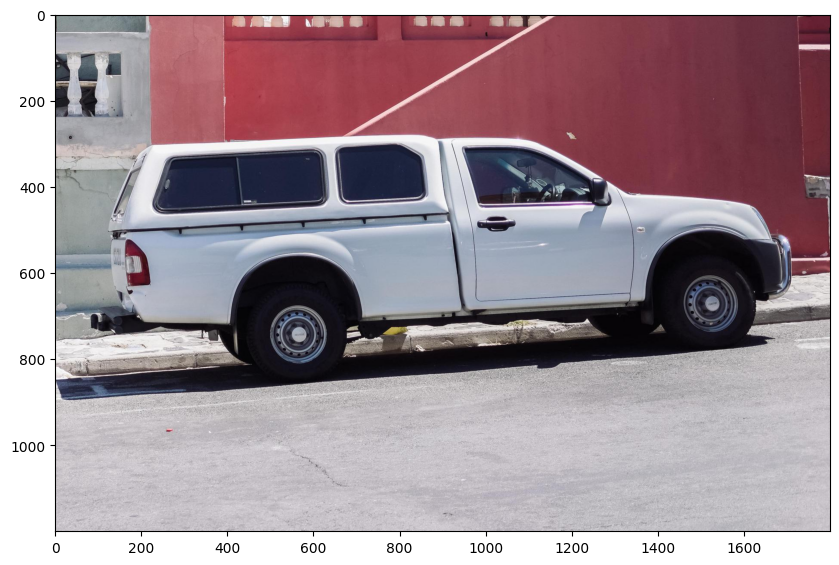

In [6]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis("on")
plt.show()

## Selecting objects with SAM

First, load the SAM model and predictor.

In [7]:
sam = tfimm.create_model("sam_vit_b", pretrained=True)
predictor = SAMPredictor(model=sam)

2023-04-17 01:37:48.963573: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
All PyTorch model weights were used when initializing SegmentAnythingModel.
All the weights of SegmentAnythingModel were initialized from the PyTorch model.



Process the image to produce an image embedding by calling `SAMPredictor.set_image`. `SAMPredictor` remembers this embedding and will use it for subsequent mask prediction.

In [8]:
predictor.set_image(image)

To select the truck, we choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point). Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.

In [9]:
points = np.array([[500, 375]])
labels = np.array([1])

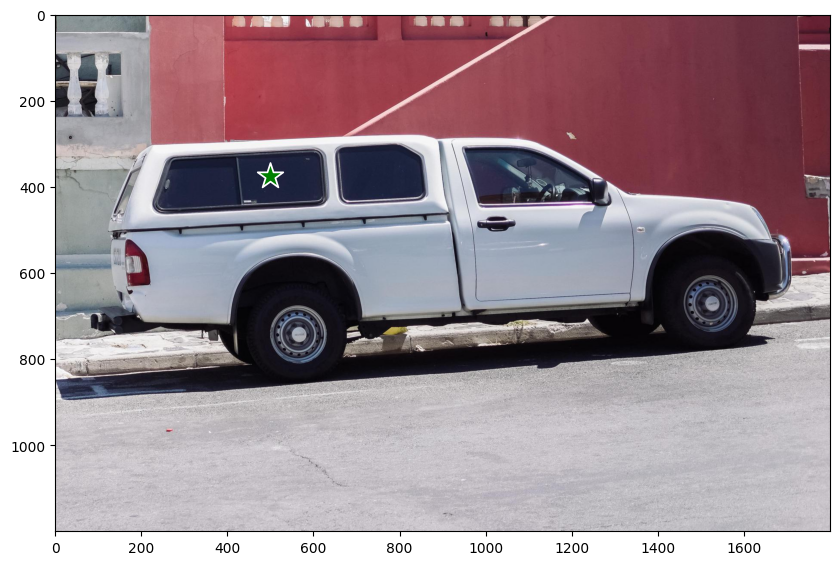

In [10]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_points(points, labels, plt.gca())
plt.axis("on")
plt.show()

Predict with `SAMPredictor.__call__`. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.

In [11]:
masks, scores, logits = predictor(
    points=points,
    labels=labels,
    multimask_output=True,
)

With `multimask_output=True` (the default setting), SAM outputs 3 masks, where scores gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt. When `False`, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use `multimask_output=True` even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in scores. This will often result in a better mask.

In [12]:
masks.shape  # (number_of_masks) x H x W

(3, 1200, 1800)

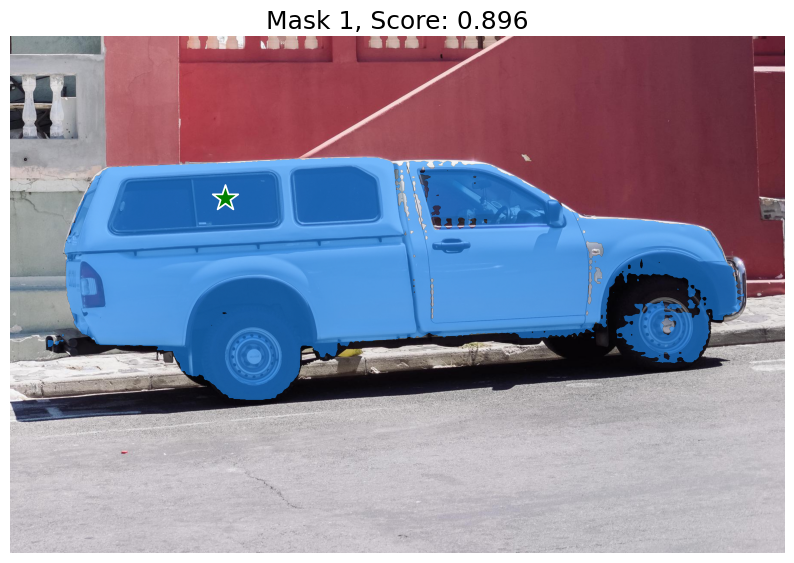

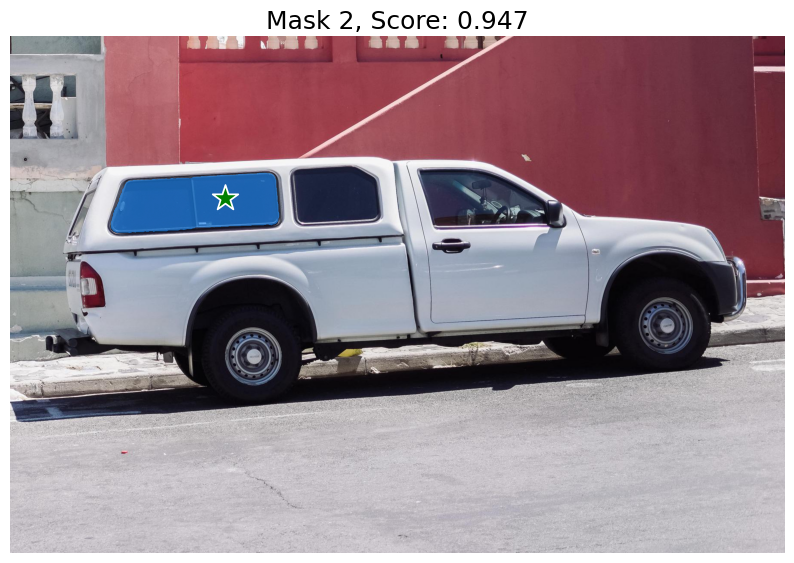

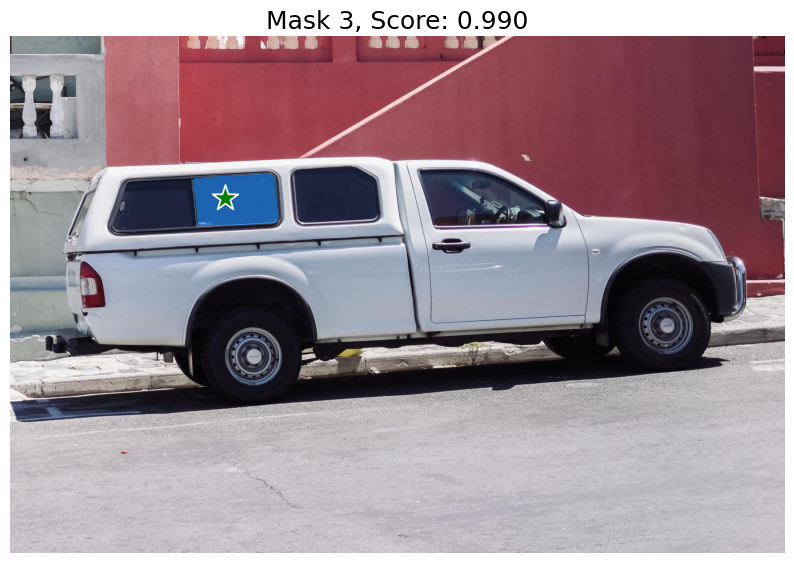

In [13]:
for j, (mask, score) in enumerate(zip(masks, scores), 1):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(points, labels, plt.gca())
    plt.title(f"Mask {j}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show() 

## Specifying a specific object with additional points

The single input point is ambiguous, and the model has returned multiple 
objects consistent with it. To obtain a single object, multiple points can 
be provided. If available, a mask from a previous iteration can also be 
supplied to the model to aid in prediction. When specifying a single 
object with multiple prompts, a single mask can be requested by setting 
`multimask_output=False`.

In [14]:
points = np.array([[500, 375], [1125, 625]])
labels = np.array([1, 1])

# Choose the first mask and refine it
mask_input = logits[[0], :, :]  

In [15]:
masks, _, _ = predictor(
    points=points,
    labels=labels,
    masks=mask_input,
    multimask_output=False,
)

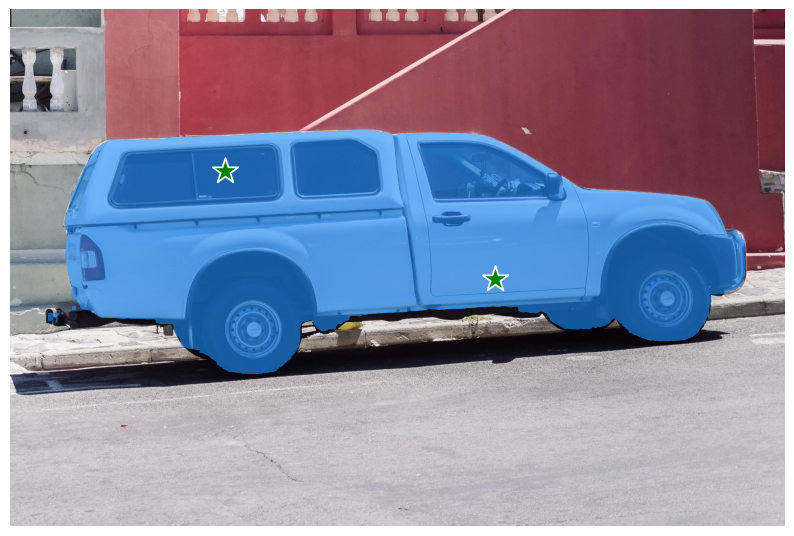

In [16]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(points, labels, plt.gca())
plt.axis("off")
plt.show() 

To exclude the car and specify just the window, a background point 
(with label 0, here shown in red) can be supplied.

In [17]:
points = np.array([[500, 375], [1125, 625]])
labels = np.array([1, 0])

mask_input = logits[[np.argmax(scores)], :, :]  # Choose the model's best mask

In [18]:
masks, _, _ = predictor(
    points=points,
    labels=labels,
    masks=mask_input,
    multimask_output=False,
)

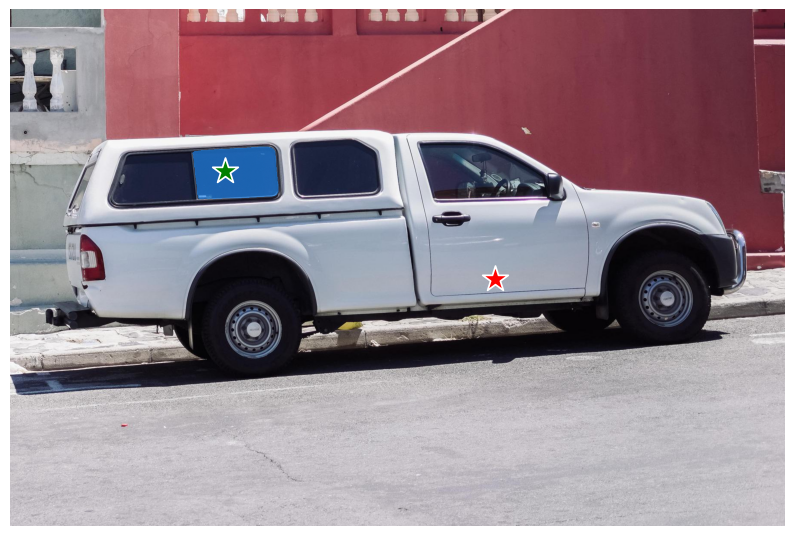

In [19]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(points, labels, plt.gca())
plt.axis("off")
plt.show() 

## Specifying a specific object with a box

The model can also take a box as input, provided in xyxy format.

In [20]:
boxes = np.array([[425, 600, 700, 875]])

In [21]:
masks, _, _ = predictor(
    boxes=boxes,
    multimask_output=False,
)

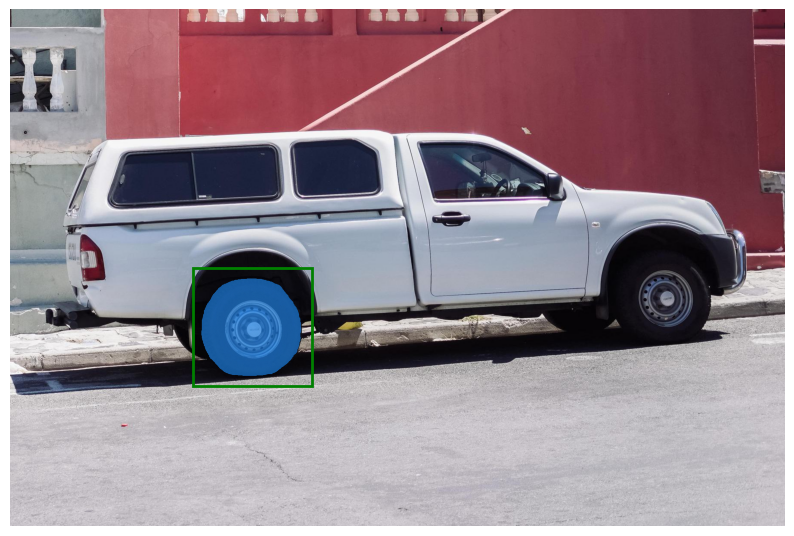

In [22]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_boxes(boxes, plt.gca())
plt.axis('off')
plt.show()

## Combining points and boxes

Points and boxes may be combined, just by including both types 
of prompts to the predictor. Here this can be used to select 
just the trucks's tire, instead of the entire wheel.

In [23]:
boxes = np.array([[425, 600, 700, 875]])
points = np.array([[575, 750]])
labels = np.array([0])

In [24]:
masks, _, _ = predictor(
    points=points,
    labels=labels,
    boxes=boxes,
    multimask_output=False,
)

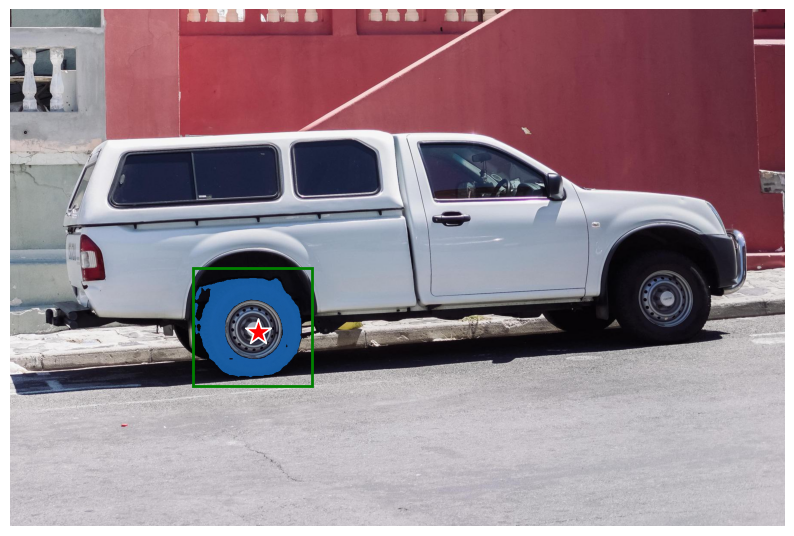

In [25]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_boxes(boxes, plt.gca())
show_points(points, labels, plt.gca())
plt.axis('off')
plt.show()

## Batched input prompts

In [26]:
# Four individual box prompts
boxes = np.array(
    [[[75, 275, 1725, 850]],
     [[425, 600, 700, 875]],
     [[1375, 550, 1650, 800]],
     [[1240, 675, 1400, 750]]]
)

In [27]:
boxes.shape

(4, 1, 4)

In [28]:
masks, _, _ = predictor(
    boxes=boxes,
    multimask_output=False,
)

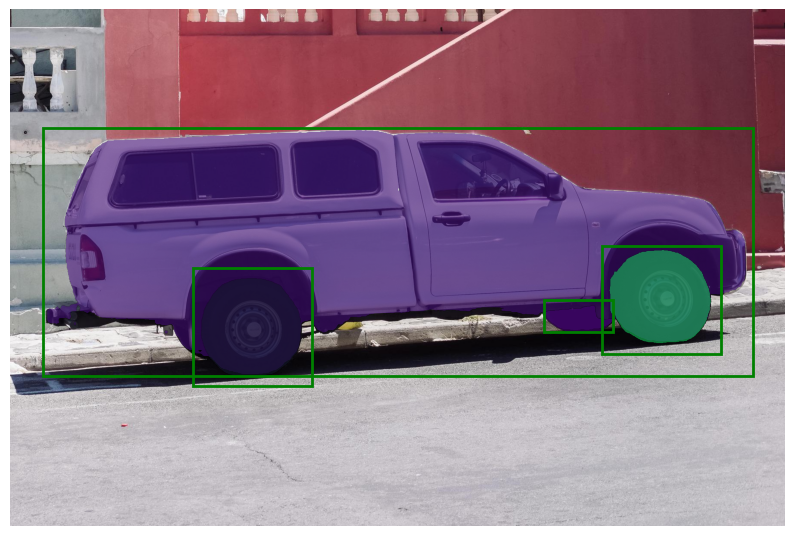

In [29]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask, plt.gca(), random_color=True)
for box in boxes:
    show_boxes(box, plt.gca())
plt.axis("off")
plt.show()

## End-to-end inference

If all prompts are available in advance, it is possible 
to run SAM directly in an end-to-end fashion. This also 
allows batching over images.

In [31]:
from tfimm.architectures.segment_anything import ImageResizer

We have one prompt for each image

In [32]:
image1 = image  # truck.jpg from above
image1_boxes = np.array([[75, 275, 1725, 850]])

image2 = cv2.imread('images/groceries.jpg')
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2_boxes = np.array([[450, 170, 520, 350]])

Images need to be resized to the model input size (by default (1024, 1024)).
We do this by first resizing the image while preserving the aspect ratio
so that the longer side equals 1024. Then we pad the image to be square.

In [34]:
preprocessing = tfimm.create_preprocessing(model_name=sam.cfg.name)

resizer1 = ImageResizer(
    src_size=image1.shape[:2], dst_size=sam.input_size
)
resizer2 = ImageResizer(
    src_size=image2.shape[:2], dst_size=sam.input_size
)

def prepare_image(image, resizer, preprocessing):
    image = resizer.scale_image(image)
    image = resizer.pad_image(image)
    image = tf.convert_to_tensor(image)
    image = preprocessing(image)
    return image

In [35]:
images = tf.stack(
    [
        prepare_image(image1, resizer1, preprocessing),
        prepare_image(image2, resizer2, preprocessing),
    ],
    axis=0,
)
boxes = tf.stack(
    [
        resizer1.scale_boxes(image1_boxes), 
        resizer2.scale_boxes(image2_boxes)
    ], 
    axis=0,
)
boxes = tf.cast(boxes, tf.float32)

# We need to pass zero-tensors for prompt types we are not utilising
points = tf.zeros((2, 0, 2))
labels = tf.zeros((2, 0), dtype=tf.int32)
masks = tf.zeros((2, 0, *sam.mask_size))

We then combine all inputs into an input dictionary.

In [36]:
inputs = {
    "images": images, 
    "points": points, 
    "labels": labels, 
    "boxes": boxes, 
    "masks": masks,
}

We ask the model to return logits, because we will have to downscale 
masks to the original image size

In [37]:
masks, scores, logits = sam(inputs=inputs, multimask_output=False, return_logits=True)

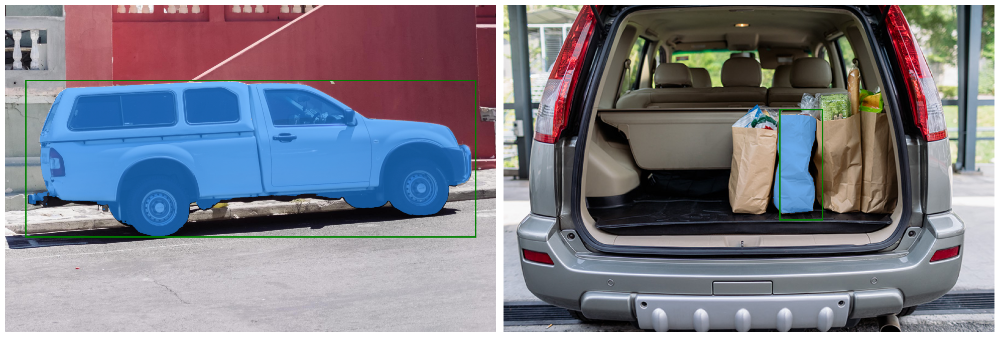

In [38]:
fig, ax = plt.subplots(1, 2, figsize=(20, 20))

ax[0].imshow(image1)
mask1 = resizer1.postprocess_mask(
    masks[0].numpy(), threshold=sam.mask_threshold
)
show_mask(mask1, ax[0])
show_boxes(image1_boxes, ax[0])
ax[0].axis("off")

ax[1].imshow(image2)
mask2 = resizer2.postprocess_mask(
    masks[1].numpy(), threshold=sam.mask_threshold
)
show_mask(mask2, ax[1])
show_boxes(image2_boxes, ax[1])
ax[1].axis("off")

plt.tight_layout()
plt.show()

## Changing input resolution

We can load the model at a different input resolution.

In [39]:
sam = tfimm.create_model("sam_vit_b", pretrained=True, input_size=(640, 640))
predictor = SAMPredictor(model=sam)

All PyTorch model weights were used when initializing SegmentAnythingModel.
All the weights of SegmentAnythingModel were initialized from the PyTorch model.



As before we set the image and calculate the predictions.

In [40]:
predictor.set_image(image)

In [41]:
points = np.array([[500, 375]])
labels = np.array([1])

In [42]:
masks, scores, logits = predictor(
    points=points,
    labels=labels,
    multimask_output=True,
)

The predicted masks still have the same shape as images.

In [43]:
masks.shape

(3, 1200, 1800)

But the logits are now of shape (160, 160), which is `input_size / 4`.

In [44]:
logits.shape

(3, 160, 160)

We do lose some of the accuracy, in particular the first mask is of lower quality.

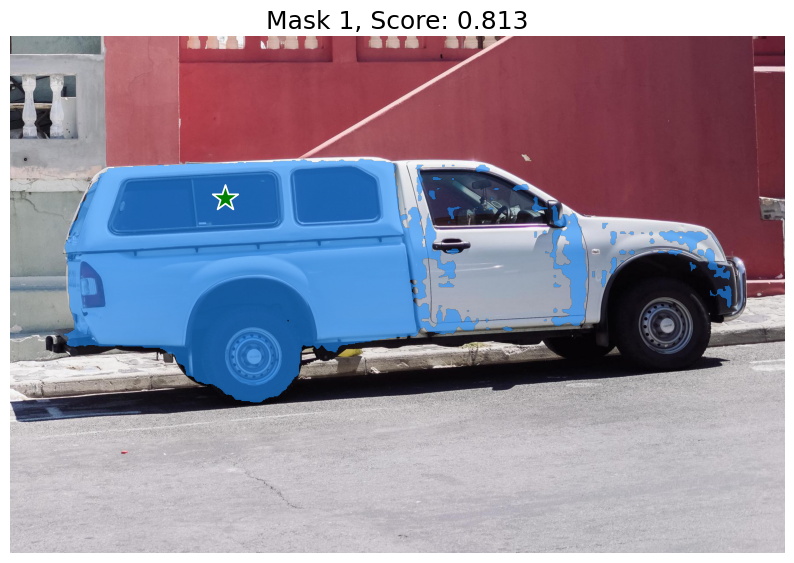

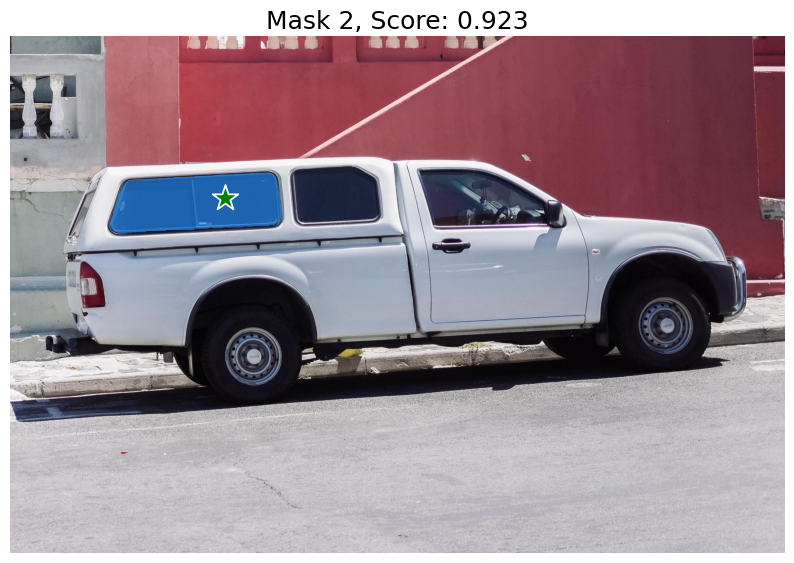

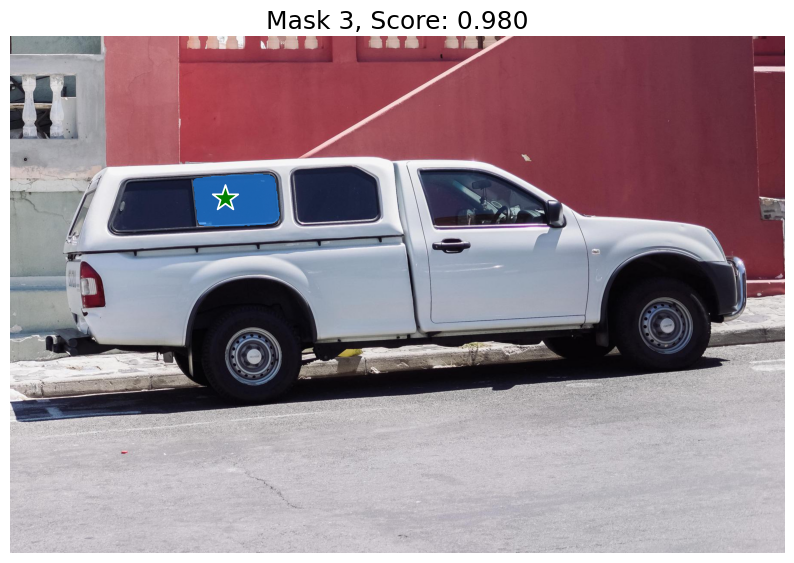

In [45]:
for j, (mask, score) in enumerate(zip(masks, scores), 1):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(points, labels, plt.gca())
    plt.title(f"Mask {j}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

## Models with flexible input resolution

We can also load the model with a setting that accepts arbitrary input sizes by setting `fixed_input_size=False`.

In [46]:
sam = tfimm.create_model("sam_vit_b", pretrained=True, fixed_input_size=False)
predictor = SAMPredictor(model=sam)

All PyTorch model weights were used when initializing SegmentAnythingModel.
All the weights of SegmentAnythingModel were initialized from the PyTorch model.



We resize the image to a smaller resolution.

In [47]:
image_low_res = cv2.resize(image, (900, 600))

In [48]:
predictor.set_image(image_low_res)

Note that we have to adjust the location of the prompt point, 
since we have changed the coordinate space of the input image.

In [49]:
points = np.array([[250, 185]])
labels = np.array([1])

In [50]:
masks, scores, logits = predictor(
    points=points,
    labels=labels,
    multimask_output=True,
)

The predicted masks still have the same shape as images.

In [51]:
masks.shape

(3, 600, 900)

But the logits are now of shape (152, 228), which indicates that the model
input resolution is (608, 912), which are the nearest multiples of 16 to 
the image size.

In [52]:
logits.shape

(3, 152, 228)

As in the previous example we do lose some of the accuracy, in particular the first mask is of lower quality.

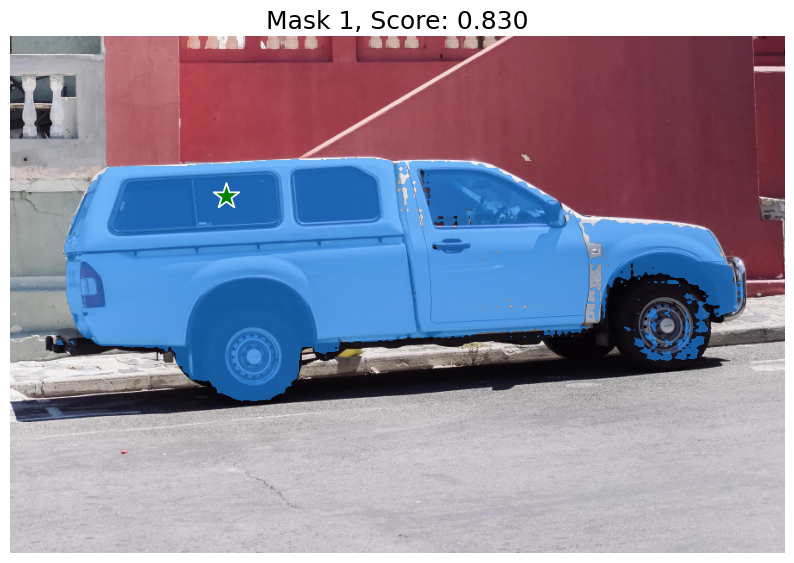

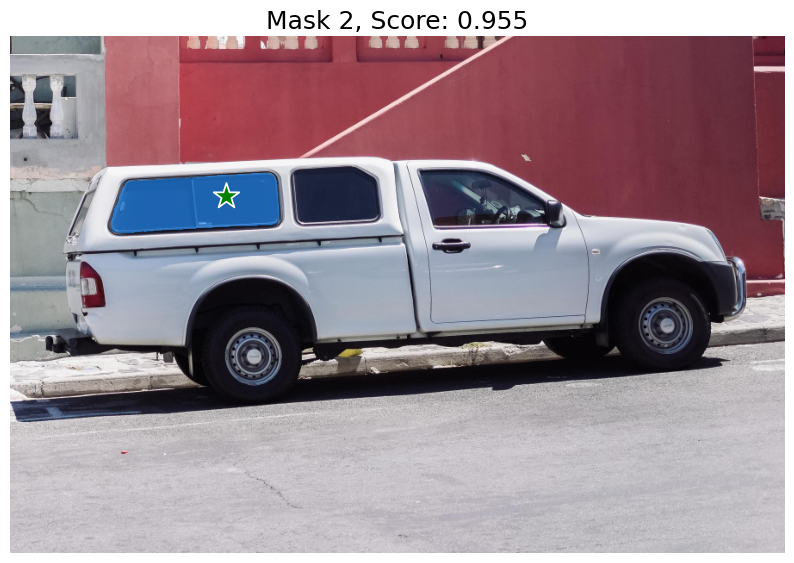

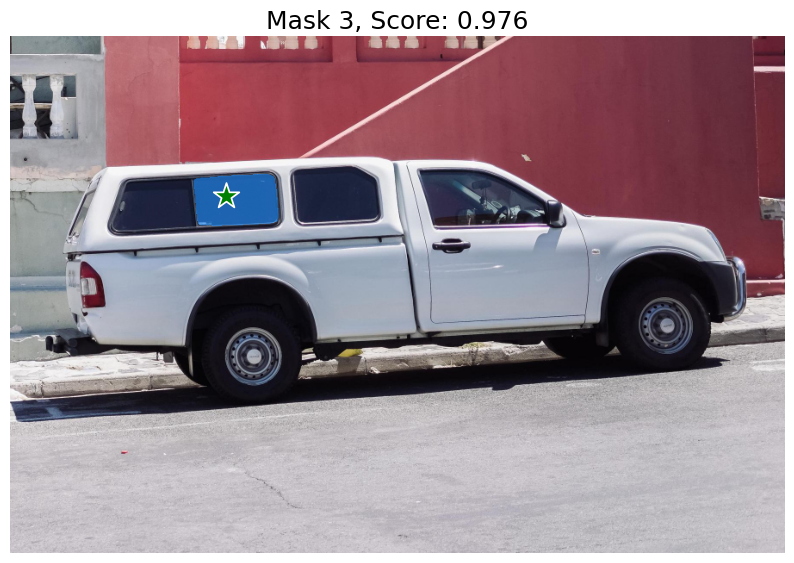

In [53]:
for j, (mask, score) in enumerate(zip(masks, scores), 1):
    plt.figure(figsize=(10,10))
    plt.imshow(image_low_res)
    show_mask(mask, plt.gca())
    show_points(points, labels, plt.gca())
    plt.title(f"Mask {j}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()